In [8]:
using Plots, StatsBase

In [93]:
n=10000
x = 1 .+ 3*log.(1 ./ rand(n))
y = 1 .+ 1 ./ (rand(n).^(1/2))
z = 1 .+ abs.(randn(n)./randn(n));

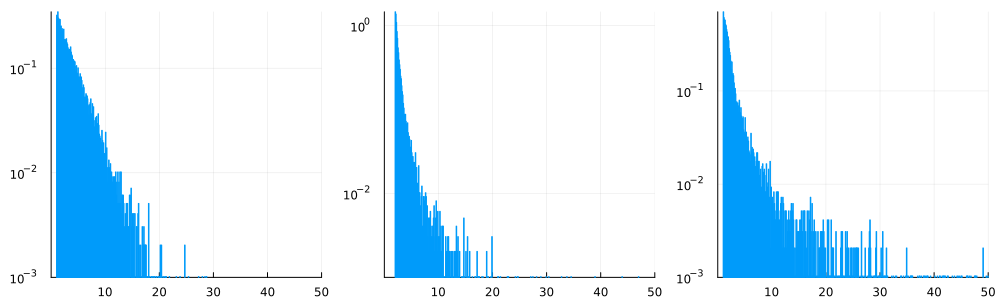

In [71]:
function histo(data)
    p = histogram(data, linecolor=:match, bins=range(1,50, 500), normalize=true, yaxis=:log, xaxis=:log)
    plot!(p, xlims=(0,50), legend=nothing, xticks=([10, 20, 30, 40, 50],[10, 20, 30, 40, 50] ))
    return p 
end 
p1, p2, p3 = histo(x), histo(y), histo(z)
h1 = plot(p1,p2,p3, layout=(1,3), size=(1000,300))
savefig(h1, "../img/histo_tail.png")
h1

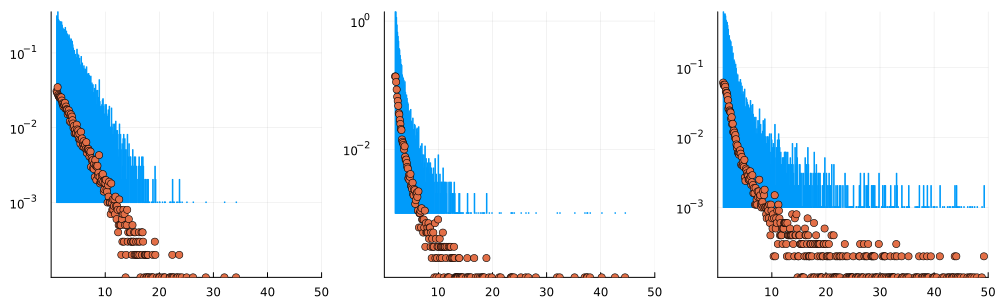

In [119]:
function histofit(data)
    h = fit(Histogram, data, range(1,50,500))#, nbins=range(1,50,500))
    edges = collect(h.edges[1])[1:end-1]
    X = cat(log.(edges), ones(499), dims=2)
    Y = (h.weights)/length(data)
    XX = X[Y.>0,:]
    YY = log.(Y[Y.>0])
    β = XX \ YY

    p = histogram(data, linecolor=:match, bins=range(1,50, 500), normalize=true, yaxis=:log, xaxis=:log)
    yhat = exp.(XX*β)
    #@show yhat[1:5], h.weights[1:5]/n
    scatter!(p, exp.(XX[:,1]), exp.(YY), xaxis=:log, yaxis=:log)
    plot!(p, xlims=(0,50), legend=nothing, xticks=([10, 20, 30, 40, 50],[10, 20, 30, 40, 50] ))
    return p 
end 
p1, p2, p3 = histofit(x), histofit(y), histofit(z)
h1 = plot(p1,p2,p3, layout=(1,3), size=(1000,300))
#savefig(h1, "../img/histo_tail.png")
h1

In [94]:
data = y
h = fit(Histogram, data, range(1,50,500))#, nbins=range(1,50,500))
edges = collect(h.edges[1])[1:end-1]
X = cat(log.(edges), ones(499), dims=2)
Y = (h.weights)/length(data)
XX = X[Y.>0,:]
YY = log.(Y[Y.>0])
β = XX \ YY

2-element Vector{Float64}:
 -2.4997199244172665
 -1.8639895260281987

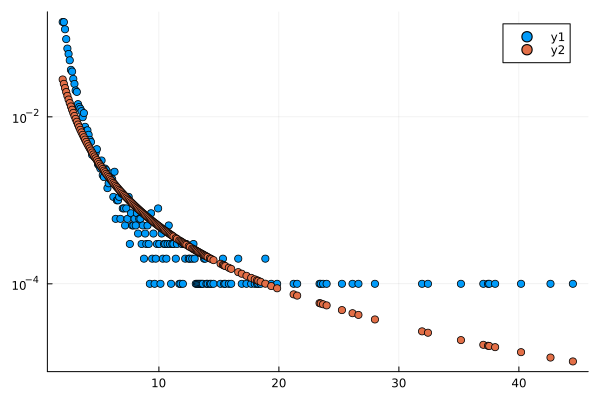

In [116]:
scatter(exp.(XX[:,1]), exp.(YY))
scatter!(exp.(XX[:,1]), exp.(XX*β))
plot!(yaxis=:log)

In [102]:
X*β

499-element Vector{Float64}:
  -1.8639895260281987
  -2.0981362695661323
  -2.3122168494931508
  -2.5094007324366943
  -2.6921611099104403
  -2.862465001758804
  -3.021902604930058
  -3.171777794015126
  -3.3131729847753357
  -3.4469966102866993
   ⋮
 -11.598372809274
 -11.603365424148103
 -11.608348087296752
 -11.613320838314369
 -11.618283716559551
 -11.623236761156933
 -11.628180010999037
 -11.633113504748113
 -11.638037280837946

In [111]:
function ranko(data)
    sdata, n = sort(data), length(data) 
    p = scatter(sdata, [n - i + 1 for i in 1:n]./n, markerstrokewidth=0)
    plot!(p, legend=nothing, xlims=(0,100), xaxis=:log, yaxis=:log, xticks=([1, 50, 100],[1, 50, 100] ))
    return p 
end 
p1, p2, p3 = ranko(x), ranko(y), ranko(z)
h2 = plot(p1,p2,p3, layout=(1,3), size=(1000,300))
savefig(h2, "../img/rank_plot.png")

"/home/simon/Documents/SimonCoste.github.io/posts/img/rank_plot.png"


| model 1      | model 2 | model 3 |
| ----------- | ----------- | --- |
| 0.86      | 0.72       | 1.25 | 

In [112]:
function pareto_mle(data)
    invs = sum(log.(data))/length(data)
    return 1/invs
end

println("$(pareto_mle(x)) |  $(pareto_mle(y)) |  $(pareto_mle(z))")

0.8672304441023625 |  1.1308771709070446 |  1.0767922240441379


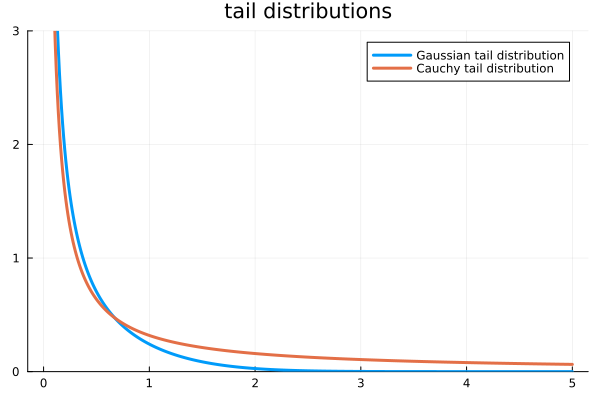

In [113]:
u = 0:0.01:5
v = exp.(-u.^2 / 2) ./ (sqrt(2*pi)*u)
w = 1 ./ (pi*u)
plot(u,v, label="Gaussian tail distribution", lw=3)
plot!(u,w, label="Cauchy tail distribution", lw=3)
p=plot!(ylims=(0,3), title="tail distributions")
#plot!(yaxis=:log, xlims=(0.1,10))


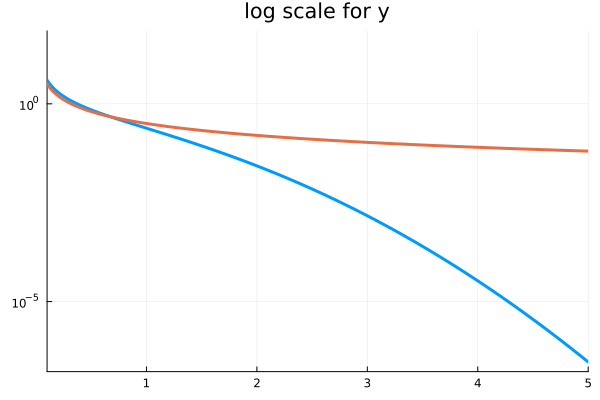

In [114]:
plot(u,v, lw=3)
plot!(u,w, lw=3)
q = plot!(yaxis=:log, xlims=(0.1, 5), legend=nothing, title="log scale for y")
#plot!(yaxis=:log, xlims=(0.1,10))

In [115]:
plot(p,q,layout=(1,2), size=(1000,200))
savefig("../img/tails.png")

"/home/simon/Documents/SimonCoste.github.io/posts/img/tails.png"

In [116]:
function hill(data)
    sdata, n = reverse(sort(data)), length(data)
    out = zeros(n-1)
    for k in 2:n
        out[k-1] = sum(log.(sdata[1:k] ./ sdata[k]))/k
    end 
    return 1 ./ out 
end
hx = hill(x)
hy = hill(y)
hz = hill(z) 


9999-element Vector{Float64}:
 2.3580926786300007
 1.435033125948583
 1.3404060799356707
 1.343744809076382
 1.5777345450208178
 1.4225221667068284
 1.605887211873046
 1.1875724969789938
 1.2593369134820758
 1.2606428357642683
 ⋮
 1.0772664571186197
 1.077276636948097
 1.0771605778644
 1.0772488779082878
 1.0773564041584054
 1.0774072462117643
 1.077413955689071
 1.0773774869108281
 1.0769671941689265

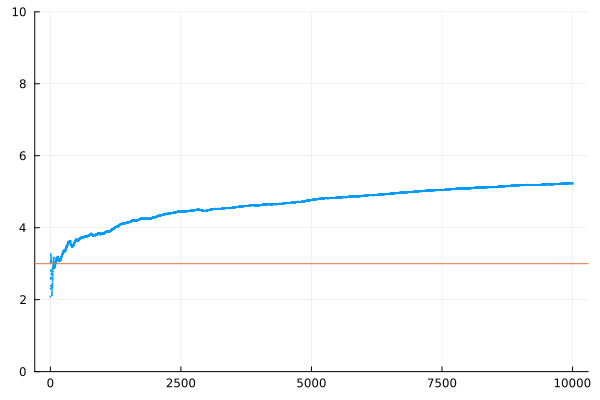

In [129]:

scatter(hy, markerstrokewidth=0, ms=1, legend=nothing, ylims=(0,10))
hiy = hline!([3])


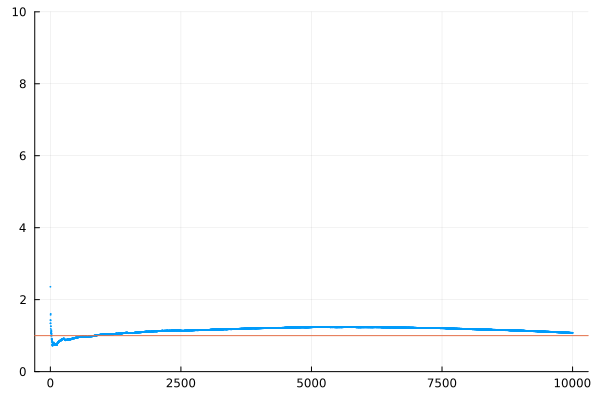

In [126]:
scatter(hz, markerstrokewidth=0, ms=1, legend=nothing, ylims=(0,10))
hiz = hline!([1])

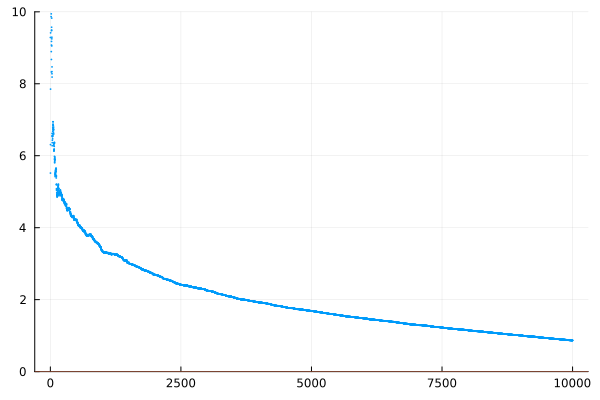

In [127]:
scatter(hx, markerstrokewidth=0, ms=1, legend=nothing, ylims=(0,10))
hix = hline!([0])

In [131]:
hillplots = plot(hix, hiy, hiz, layout=(1,3), size=(1000,300))
savefig(hillplots, "../img/hill_plots.png")

"/home/simon/Documents/SimonCoste.github.io/posts/img/hill_plots.png"